# Machine Learning for Image Segmentation

Welcome to this interactive notebook on **Machine Learning for Image Segmentation**, developed for the **HIDA Lecture Series**.  
In this session, you will explore how deep learning models can learn to separate biological structures—such as cell nuclei—from microscopy images.

The goal of this notebook is to **demystify image segmentation** by guiding you step by step through the essential concepts, from data preparation to model evaluation.  
You will work with a **toy dataset** derived from the [Data Science Bowl 2018 (DSB2018)](https://www.kaggle.com/c/data-science-bowl-2018/) and train a **U-Net**, a widely used architecture for biomedical image segmentation.

By the end of this tutorial, you will:
- Understand how convolutional neural networks perform pixel-wise segmentation.
- Train and evaluate a simple **U-Net** model for foreground–background segmentation.
- Compare your trained model to a **pretrained network**.
- Learn how **instance segmentation** with **CellPose** can detect individual cells.
- Apply segmentation results to real biological questions, such as **cell counting and statistical analysis**.

---

## 0. Setup

We will start by setting up the environment to run this notebook conveniently in **Google Colab**.  
Run the following cell to mount your Google Drive, clone the repository, and unpack the example data automatically.

In [ ]:
import os, sys, time, importlib, zipfile, glob
from google.colab import drive

# 1. Mount Google Drive
drive.mount("/content/drive", force_remount=False)

# 2. Define base folder (where your notebook + repo + data.zip live)
BASE_DIR = "/content/drive/My Drive/Colab Notebooks/HIDA_lecture_image_segmentation"

# 3. Clone repo only if it does not yet exist
if not os.path.exists(BASE_DIR):
    os.makedirs(os.path.dirname(BASE_DIR), exist_ok=True)
    print("📥 Cloning repository ...")
    !git clone --depth 1 https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation.git "$BASE_DIR"
else:
    print("✅ Repository already exists in Drive, skipping clone.")

# 4. Change directory and add to Python path
os.chdir(BASE_DIR)
if BASE_DIR not in sys.path:
    sys.path.append(BASE_DIR)
print("📂 Current working directory:", os.getcwd())

# 5️. Unzip data.zip
zip_path = os.path.join(BASE_DIR, "data.zip")
data_dir = os.path.join(BASE_DIR, "data")
if os.path.exists(zip_path):
    if not os.path.exists(data_dir):
        print("🗜️ Unzipping data.zip ...")
        with zipfile.ZipFile(zip_path, "r") as zip_ref:
            zip_ref.extractall(data_dir)
        print(f"✅ Data extracted to {data_dir}")
    else:
        print("✅ Data folder already exists, skipping unzip.")
else:
    print("⚠️ No data.zip found in the repo folder.")

### Access dataset

After setting up the environment, let's verify that the dataset has been correctly unpacked and is accessible.

Run the following cell to check that the training data is available and to display a short summary.


In [ ]:
fls = glob.glob(os.path.join("data", "dsb2018", "train", "*.zarr"))
print(f"Found {len(fls)} training files.")
print(f"Example file: {fls[0]}")

### Install and import packages

Next, we install and import all necessary Python packages for this notebook. 

Run the following cells to install the dependencies and import all required modules.


In [ ]:
!pip install numpy pillow matplotlib scikit-image cellpose "zarr<3" torch torchvision torchsummary tensorboard mahotas albumentations tqdm pandas

In [ ]:
# %matplotlib inline

# %load_ext autoreload
# %autoreload 2

import datetime
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import zarr
import albumentations as A

from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch.utils.tensorboard import SummaryWriter
from torchsummary import summary

from utils.label import PredictionType
from utils.train_val_test import step_train_val_routine, simple_test
from utils.visualize import *

plt.rcParams['image.cmap'] = 'gist_earth'
torch.backends.cudnn.benchmark = True

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1. Data

In this tutorial, we will work with a **subset** of the dataset from the [Kaggle Data Science Bowl 2018 (DSB2018)](https://www.kaggle.com/c/data-science-bowl-2018/), a large-scale challenge focused on identifying cell nuclei in microscopy images.  
This dataset has become a standard benchmark for evaluating algorithms in **biomedical image segmentation**.

The data provided here has been converted into **ZARR format**, an efficient storage format for large multidimensional arrays such as image stacks.  
The folder structure follows the organization of the original dataset, with separate subfolders for **training**, **validation**, and **test** data.

---

### Raw Data

Each sample is a **grayscale microscopy image** of size **360 × 360 pixels**, showing cell nuclei captured under various microscopes and imaging conditions.  
The dataset is intentionally small to allow for fast experimentation:
- **30 images** for training  
- **8 images** for validation  
- **16 images** for testing  

Below is an example of the type of data you will be working with:

![kaggle_example](https://data.broadinstitute.org/bbbc/BBBC038/BBBC038exampleimage1.png)

---

### Ground Truth Labels

Each image is accompanied by a **manually annotated segmentation mask** that defines the true structure of the cells.  
These pixel-wise annotations are provided in two segmentation variants:

- **2-class segmentation**:  
  - Background (0)  
  - Foreground / Cell (1)  

- **3-class segmentation**:  
  - Background (0)  
  - Cell Interior (1)  
  - Cell Boundary (2)  

Run the following cell repeatedly to explore random examples of images along with their ground-truth segmentation labels.

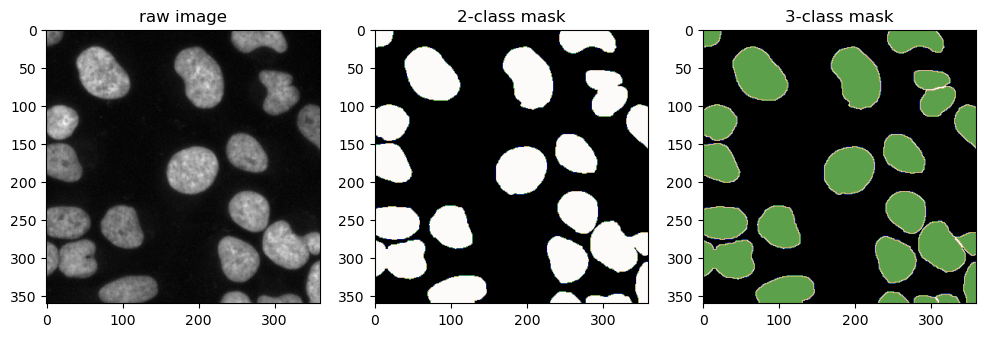

In [2]:
plot_random_example()

### Data Augmentation

Especially when the size of the dataset is limited, data augmentation is essential to get good results.
Extend your data loader to augment your data during training on the fly.
Think about what kind of augmentation to use (e.g. flips, rotation, elastic).

Here, we have prepared the code to use the external data augmentation library **albumentations**.

In [3]:
###########################################################################
#                               PLAYGROUND                                #
###########################################################################
# Use image augmentations of your choice using Albumentations.
# Image augmentations are a useful tool to artificially increase your training data.
###########################################################################

import albumentations as A

AUGMENTATION_LIST = [
    # --- Geometric augmentations ---
    A.HorizontalFlip(p=0.5),  # Flip image horizontally with 50% probability
    A.VerticalFlip(p=0.5),    # Flip image vertically with 50% probability
    A.Rotate(limit=45, border_mode=0, p=0.7),  # Random rotation within ±45°, fill borders with black

    # A.Affine(  # Apply combined scaling, translation, rotation, and shear
    #     scale=(0.9, 1.1),
    #     translate_percent=(0.05, 0.05),
    #     rotate=(-10, 10),
    #     shear=(-5, 5),
    #     fit_output=False,
    #     cval=0,
    #     p=0.5
    # ),

    # A.ElasticTransform(  # Apply smooth, random elastic deformation
    #     alpha=50,
    #     sigma=8,
    #     interpolation=1,
    #     border_mode=0,
    #     p=0.5
    # ),

    # --- Intensity augmentations ---
    # A.RandomBrightnessContrast(  # Randomly change brightness and contrast
    #     brightness_limit=0.2,
    #     contrast_limit=0.2,
    #     p=0.5
    # ),
    # A.GaussianBlur(blur_limit=(1, 3), p=0.3)  # Apply slight blurring to simulate focus variation
]

###########################################################################
#                                                                         #
###########################################################################

### Check the data

Before training the model, it’s important to **inspect your dataset and data loader** to ensure everything is working as expected.  
In this step, we visualize a few random training samples to confirm that:

- Images and segmentation masks are correctly aligned  
- Data augmentations (if enabled) look realistic and biologically plausible   

Run the following cell multiple times to view different augmented examples and verify that your data pipeline behaves correctly.


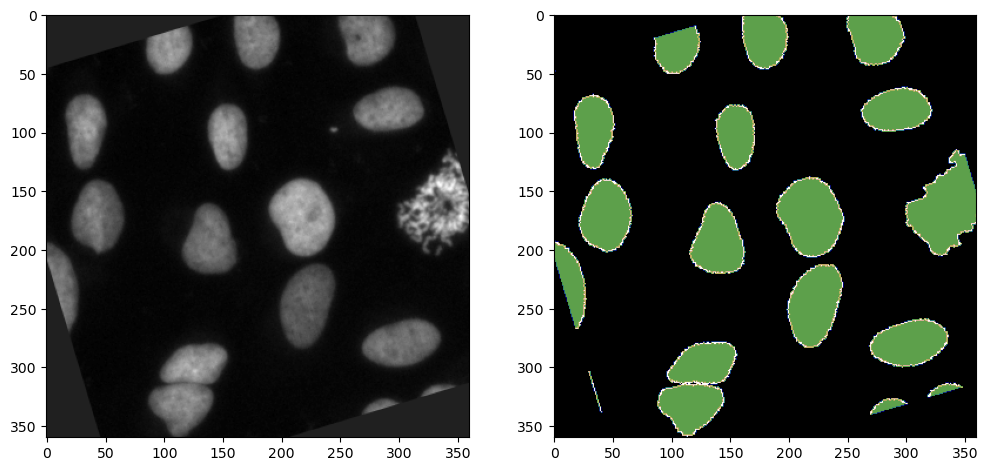

In [4]:
###########################################################################
#                               PLAYGROUND                                #
###########################################################################
SAMPLE_IDX = 2
###########################################################################
#                                                                         #
###########################################################################

from utils.dataset import TestDataset

temp_data = TestDataset(
    root_dir=os.path.join("data", "dsb2018"),
    mode="train",
    prediction_type=PredictionType.THREE_CLASS,
    augmentation_list=AUGMENTATION_LIST, 
    padding_size=0)

img, label = temp_data[SAMPLE_IDX] # Get image and label of a dataset sample

# Let's look at our augmented data (in case you implemented augmentations).
# Run this cell multiple times to see how the augmentation parameters affects the sample image and label.
plot_image(img, label, prediction_type=PredictionType.THREE_CLASS)

## 2. U-Net Model

For this task, we use the [U-Net architecture](https://arxiv.org/pdf/1505.04597.pdf), a widely adopted model for **biomedical image segmentation**.  
U-Net learns to map input images to pixel-wise segmentation masks through a symmetric **encoder–decoder** design with skip connections that preserve spatial detail.

The network is composed of:
- **Convolutional layers** for feature extraction  
- **Downsampling layers** to capture context  
- **Upsampling layers** to reconstruct fine image details  

Below is a schematic overview of the U-Net architecture:

<img src="https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png" alt="U-Net" width="700">


### Convolutional Pass

We begin by implementing a **convolutional pass**, the core building block of the U-Net.  
A convolutional pass consists of one or more **convolutional layers**, each followed by a **nonlinear activation function**.  
These layers extract spatial features such as edges, textures, and shapes from the input image — essential for distinguishing different structures during segmentation.

In the U-Net, convolutional passes are used throughout both the **encoder** (downsampling path) and **decoder** (upsampling path).
<img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/u-net-architecture-conv.png?raw=1" alt="conv_pass" width="400"><span style="color:white;">___________________________</div><img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/2D_Convolution_Animation.gif?raw=1" alt="convolution" width="400">

<img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/sobel_filter.png?raw=1" alt="sobel_filter" width="400">

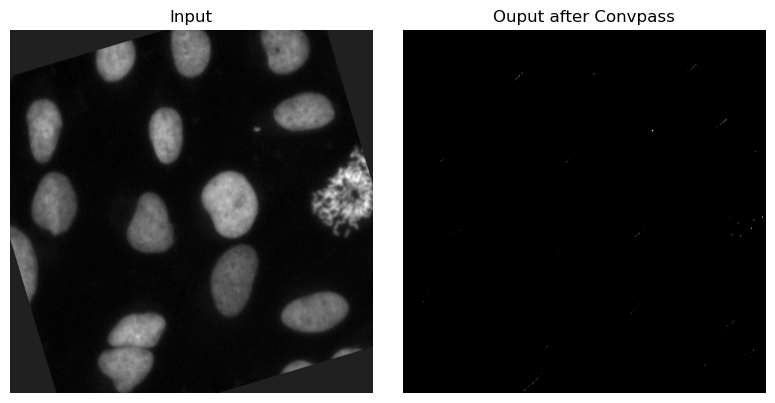

In [5]:
from utils.model import ConvPass, randomize_weights

# Set input image
input_img = img.unsqueeze(0)

# Build convolutional pass
kernels = [[3, 3], [3,3]]  # single 3x3 conv
conv_pass = ConvPass(in_channels=1, out_channels=1, kernel_sizes=kernels, activation="ReLU")

# Randomize kernel weights
randomize_weights(conv_pass, scale=1.0)

# Forward pass
output_img = conv_pass(input_img)

# Plot
plot_in_out(input_img, output_img, title="Ouput after Convpass")

### Downsample

Next, we implement a **downsampling layer** using *max pooling*.  
Downsampling reduces the **spatial resolution** of feature maps while retaining the most important information.  
This allows the network to capture broader contextual features and increases computational efficiency.

In the U-Net, downsampling is applied along the **encoder path** to progressively reduce image size and focus on higher-level structures.

<img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/u-net-architecture-down.png?raw=1" alt="downsample" width="400"><span style="color:white;">___________________________</div><img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/maxpool.gif?raw=1" alt="maxpool" width="400">


Shape of input image: torch.Size([1, 1, 360, 360])
Shape of output image after downsampling with factor [2, 2]: torch.Size([1, 1, 180, 180])


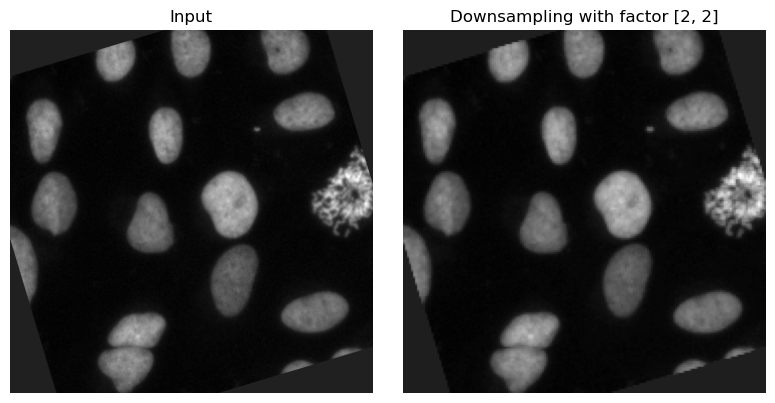

Shape of output image after downsampling with factor [5, 10]: torch.Size([1, 1, 72, 36])


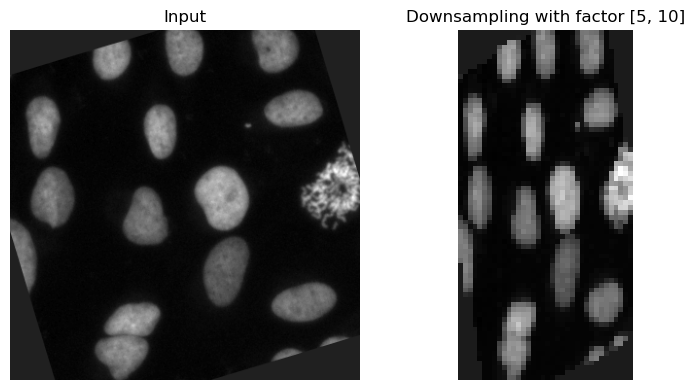

In [6]:
from utils.model import Downsample

# Set input image
input_img = img.unsqueeze(0)

downsample_factor1 = [2, 2]
downsample_factor2 = [5, 10]

down1 = Downsample(downsample_factor1)
down2 = Downsample(downsample_factor2)

# ---- Forward pass ----
down_output1 = down1(input_img)
down_output2 = down2(input_img)

# ---- Plot ----
print(f"Shape of input image: {input_img.shape}")
print(f"Shape of output image after downsampling with factor {downsample_factor1}: {down_output1.shape}")
plot_in_out(input_img, down_output1, title=f"Downsampling with factor {downsample_factor1}")
print(f"Shape of output image after downsampling with factor {downsample_factor2}: {down_output2.shape}")
plot_in_out(input_img, down_output2, title=f"Downsampling with factor {downsample_factor2}")

#### Upsample

Now we implement an **upsampling layer**, which increases the spatial resolution of feature maps.  
Upsampling reconstructs fine image details that were lost during downsampling and helps the model produce pixel-accurate segmentation masks.

In the U-Net, upsampling occurs along the **decoder path**, where feature maps are gradually expanded back to the original image size and combined with encoder features via skip connections.

<img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/u-net-architecture-up.png?raw=1" alt="upsample" width="400"><span style="color:white;">___________________________</div><img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/Nearest1.png?raw=1" alt="upsampling" width="400">


Shape of input image: torch.Size([1, 1, 180, 180])
Shape of output image after upsampling with factor [2, 2]: torch.Size([1, 1, 360, 360])


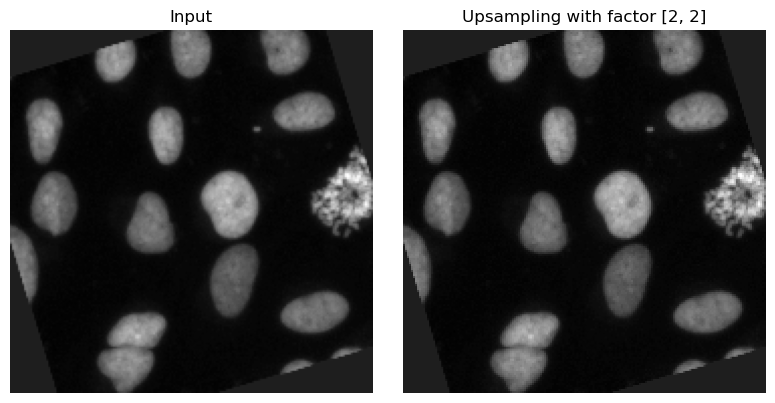

Shape of input image: torch.Size([1, 1, 72, 36])
Shape of output image after upsampling with factor [5, 10]: torch.Size([1, 1, 360, 360])


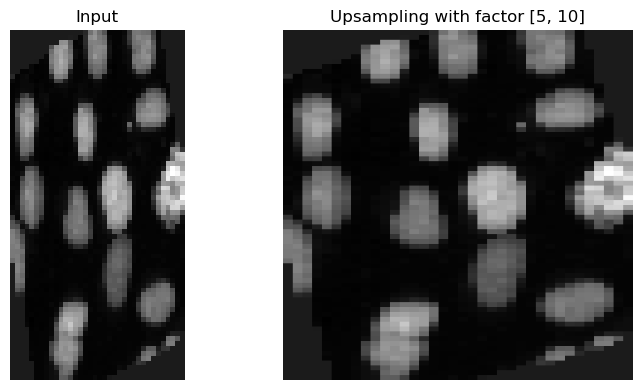

In [7]:
import torch.nn.functional as F

# Assume input_img is your original (1, H, W)
# Convert to (N, C, H, W) format required by interpolate
input_img = img.unsqueeze(0)   # (1, 1, H, W)

# Upsample back to original H, W
H, W = input_img.shape[2], input_img.shape[3]

up1 = F.interpolate(down_output1, size=(H, W), mode="nearest")
up2 = F.interpolate(down_output2, size=(H, W), mode="nearest")

#plot_in_out(input_img, up1)
#plot_in_out(down_output2, up2)

print(f"Shape of input image: {down_output1.shape}")
print(f"Shape of output image after upsampling with factor {downsample_factor1}: {up1.shape}")
plot_in_out(down_output1, up1, title=f"Upsampling with factor {downsample_factor1}")
print(f"Shape of input image: {down_output2.shape}")
print(f"Shape of output image after upsampling with factor {downsample_factor2}: {up2.shape}")
plot_in_out(down_output2, up2, title=f"Upsampling with factor {downsample_factor2}")

### Full U-Net forward pass



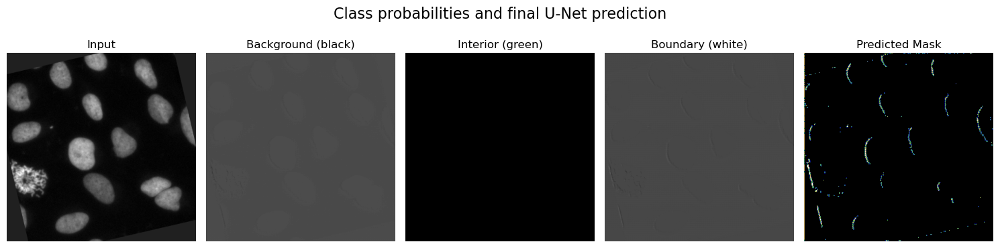

In [8]:
from utils.model import UNet

unet_data = TestDataset(root_dir=os.path.join("data","dsb2018"),
                        mode="train",
                        prediction_type=PredictionType.THREE_CLASS,
                        augmentation_list=AUGMENTATION_LIST,
                        padding_size=4)

# Get image and label of a dataset sample
img, label = unet_data[SAMPLE_IDX]
img = img.unsqueeze(0)

d_factors = [[2, 2], [2, 2], [2, 2], [2, 2]]

unet = UNet(
    in_channels=1,
    num_fmaps=8,
    fmap_inc_factors=2,
    downsample_factors=d_factors,
    activation='ReLU',
    num_fmaps_out=8,
    constant_upsample=False,
    kernel_size_down=[[(3, 3), (3, 3)]] * (len(d_factors) + 1),
    kernel_size_up=[[(3, 3), (3, 3)]] * len(d_factors),
)

task_head = torch.nn.Conv2d(in_channels=8, out_channels=3, kernel_size=1, padding=0, bias=True)

# Combine Unet and task head to your final model
net = torch.nn.Sequential(
    unet,
    task_head
)

output = net(img)
plot_unet_prediction(img, output)

## 3. Machine Learning

So far, we have explored how a randomly initialized U-Net processes an image — producing output patterns that are essentially random noise.  
The next step is to make the network **learn meaningful representations** by optimizing its weights through a **machine learning process**.

In supervised learning, the model compares its predicted segmentation to the ground truth labels and updates its internal parameters to minimize the difference between them.  
This is done iteratively using:
- A **loss function** that measures prediction error  
- An **optimizer** that adjusts the network weights to reduce this loss  

By training over many examples, the U-Net gradually learns to generate accurate segmentation masks that match the cell structures in the data.


### Prepare the datasets for training

Before training, we need to organize our data into a format that PyTorch can efficiently handle.  
A **Dataset** defines how individual samples (image and label pairs) are loaded, while a **DataLoader** groups them into mini-batches and feeds them to the model during training.

The **batch size** determines how many samples are processed together before the model updates its weights — larger batches give smoother gradients but require more memory.  

In the next cell, we create training, validation, and test datasets and prepare their corresponding data loaders.


In [9]:
from utils.dataset import KaggleDSB_dataset

dataset = os.path.join("data", "dsb2018")
data_train = KaggleDSB_dataset(
    dataset, "train", prediction_type=PredictionType.THREE_CLASS, padding_size=4)
data_val = KaggleDSB_dataset(
    dataset, "val", prediction_type=PredictionType.THREE_CLASS, padding_size=4)
data_test = KaggleDSB_dataset(
    dataset, "test", prediction_type=PredictionType.THREE_CLASS, padding_size=4)

# look at what the dataset returns
print('Train set samples: {}'.format(len(data_train)))
print('Validation set samples: {}'.format(len(data_val)))
print('Test set samples: {}'.format(len(data_test)))

# Fix a batch size and make dataloaders
BATCH_SIZE = 4 # Feel free to TUNE me
train_loader = DataLoader(data_train, batch_size=BATCH_SIZE, shuffle=True, pin_memory=True)
val_loader = DataLoader(data_val, batch_size=1, pin_memory=True)
test_loader = DataLoader(data_test, batch_size=1)

Train set samples: 30
Validation set samples: 8
Test set samples: 16


### Check GPU availability
If the device printed is "cpu", make sure you change the runtime type to GPU (see Runtime at top of notebook)
You can still train on a CPU, but the training will be much slower and you should then reduce the number of training_steps below.

In [10]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device used: ", device)
net = net.to(device)

Device used:  cpu


## Train your network
Now we train the U-Net to learn optimal weights for **3-class segmentation**.  
During training, the model predicts segmentation masks and updates its parameters to minimize the **cross-entropy loss**, which measures how well the predictions match the ground truth labels.

In [11]:
# --- Training configuration ---
TRAINING_STEPS = 2000       # Number of gradient update steps (higher = longer training, potentially better performance)
LEARNING_RATE = 1e-3      # Step size used by the optimizer to update weights
WEIGHT_DECAY = 1e-4       # Regularization term to prevent overfitting by penalizing large weights

# --- Optimizer setup ---
# AdamW is an adaptive optimizer that combines the benefits of Adam with decoupled weight decay.
optimizer = torch.optim.AdamW(net.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# --- Logging and device setup ---
# Create a timestamped directory for TensorBoard logs.
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
logger = SummaryWriter(logdir)

# --- Loss function and training mode ---
loss_function = torch.nn.CrossEntropyLoss().to(device)  # Standard loss for multi-class segmentation
activation_function = torch.nn.Softmax(dim=1)
net.train()                                       # Set model to training mode (enables dropout, batchnorm, etc.)
loss_function.train()
step = 0

# --- Start the training loop ---
# This routine handles training and validation over the specified number of steps.
step_train_val_routine(
    net,
    train_loader,
    val_loader,
    TRAINING_STEPS,
    optimizer,
    loss_function,
    logger,
    PredictionType.THREE_CLASS,
    device,
    activation_function
)


  0%|          | 0/20 [00:00<?, ?it/s]

In [12]:
%reload_ext tensorboard
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 792), started 12 days, 21:47:27 ago. (Use '!kill 792' to kill it.)

### Evaluate your model

After training, we evaluate the U-Net on the validation or test dataset to measure **how well it generalizes to unseen images**.  
This involves generating segmentation predictions and comparing them to the ground truth masks using metrics such as **pixelwise accuracy** or **visual inspection** of the results.


Average pixelwise accuracy: 0.819


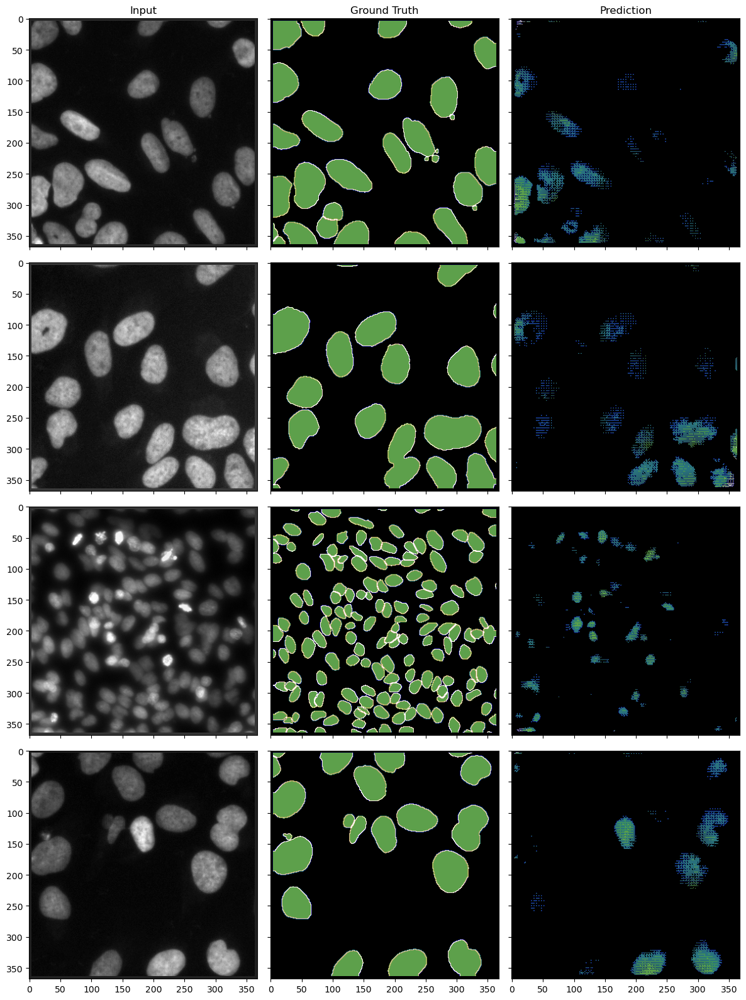

In [13]:
# Plot predicted results for test data
images, labels, predictions, mean_accuracy = simple_test(net, test_loader, activation_function, device)
print('Average pixelwise accuracy: {:.3f}'.format(mean_accuracy))

num_examples = 4
show_predictions(images[:num_examples], labels[:num_examples], predictions[:num_examples], PredictionType.THREE_CLASS)

In case you are not able to fully train the model for a large number of iteration steps you can use our **pretrained model** to evaluate.

Average pixelwise accuracy: 0.971


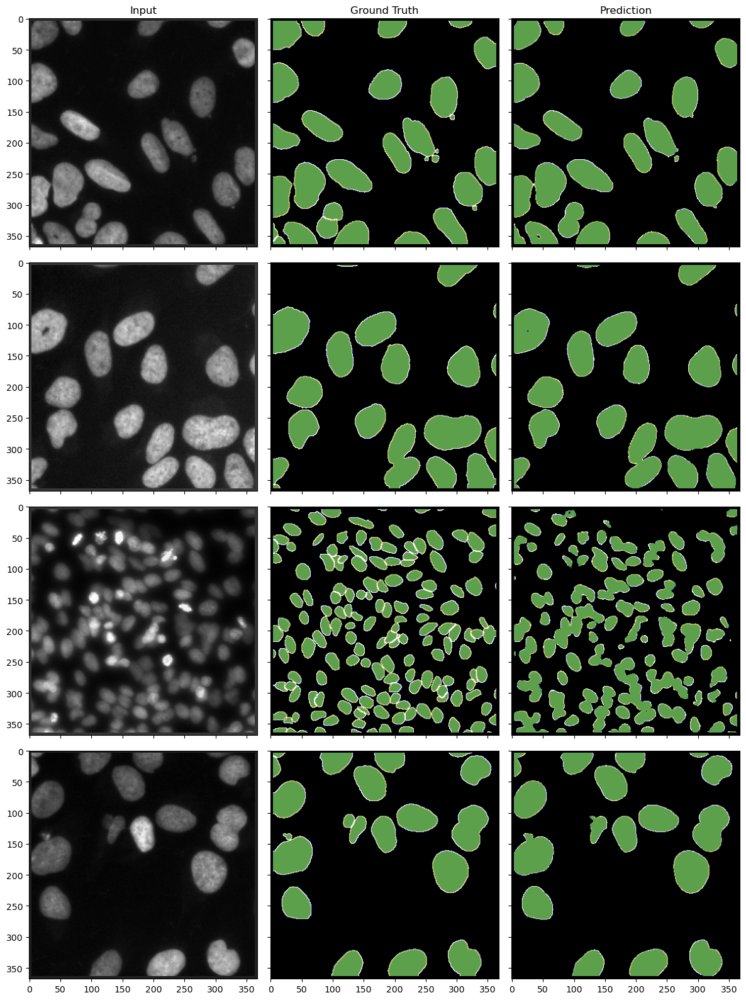

In [14]:
model_path = "model/model_unet_pretrained.pth"

net.load_state_dict(torch.load(model_path, map_location=device))
net.to(device)
net.eval()

# Plot predicted results for test data for pretrained model
images, labels, predictions, mean_accuracy = simple_test(net, test_loader, activation_function, device)
print('Average pixelwise accuracy: {:.3f}'.format(mean_accuracy))

num_examples = 4
show_predictions(images[:num_examples], labels[:num_examples], predictions[:num_examples], PredictionType.THREE_CLASS)

## 5. Instance Segmentation

### Using CellPose-SAM

[CellPose-SAM](https://www.cellpose.org/) is a general-purpose transfomer-based deep learning model for **instance segmentation** — identifying and separating individual cells or objects within an image.  
Unlike semantic segmentation, which labels all pixels of the same type together, instance segmentation assigns a **unique label to each object**.

CellPose-SAM works by predicting two **spatial flow fields** that describe how pixels move toward the centers of individual cells.  
These flows are then combined to reconstruct distinct cell masks, allowing for accurate detection, counting, and morphological analysis across diverse microscopy images.

<img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/cellpose.png?raw=1" alt="cellpose" width="700">

We use a **CellPose model that has been pretrained** on a wide variety of cell types and imaging modalities.  
This pretrained model can be directly applied to our microscopy data, enabling robust segmentation performance even without additional training.



pretrained model C:\Users\ckarg\.cellpose\models\cpsam not found, using default model
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8620848..4.596025].


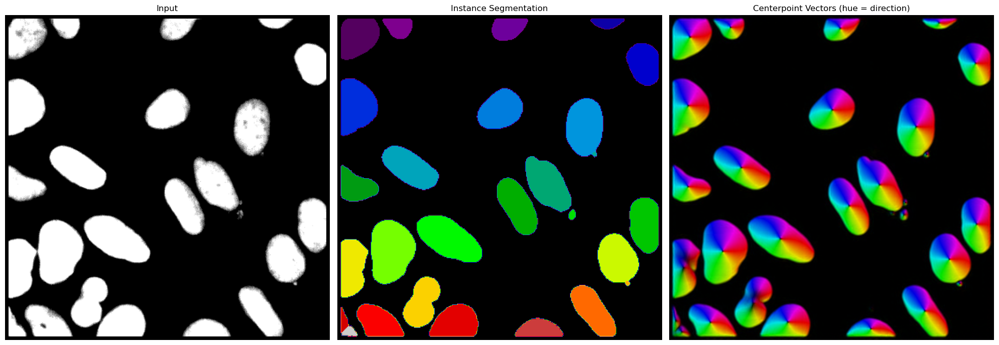

In [42]:
from cellpose import models

# --- Setup Cellpose model ---
model = models.CellposeModel(gpu=True, pretrained_model="cyto")

# --- One batch from dataloader ---
images, _ = next(iter(test_loader))   # assuming dataloader yields (img, label)
# take the first image in batch
img = images[0].detach().cpu().numpy()

if img.ndim == 3 and img.shape[0] == 1:   # (1,H,W) -> (H,W)
    img = img[0]

# --- Run Cellpose prediction ---
masks, flows, styles = model.eval(img, channels=[0,0])

# --- Plot instance segmentation mask ---
plot_cellpose_predictions(img, masks, flows)

### Using CellPose-SAM

In [ ]:
from cellpose import models

# --- Setup Cellpose model ---
model = models.CellposeModel(gpu=True)

# --- One batch from dataloader ---
images, _ = next(iter(test_loader))   # assuming dataloader yields (img, label)
# take the first image in batch
img = images[0].detach().cpu().numpy()

if img.ndim == 3 and img.shape[0] == 1:   # (1,H,W) -> (H,W)
    img = img[0]

# --- Run Cellpose prediction ---
masks, flows, styles = model.eval(img, channels=[0,0])

# --- Plot instance segmentation mask ---
plot_cellpose_predictions(img, masks, flows)

### Calculating Cell Instance Statistics

Once we have segmented individual cells using CellPose, we can extract **quantitative information** from the resulting instance masks.  
Each segmented region corresponds to a single cell, allowing us to compute properties such as **area**, **centroid position**, and other morphological features.

In this example, we visualize the **distribution of cell areas** to gain an overview of the cell size variability within the image.

Number of cells: 27
Average cell area (px): 1342.48


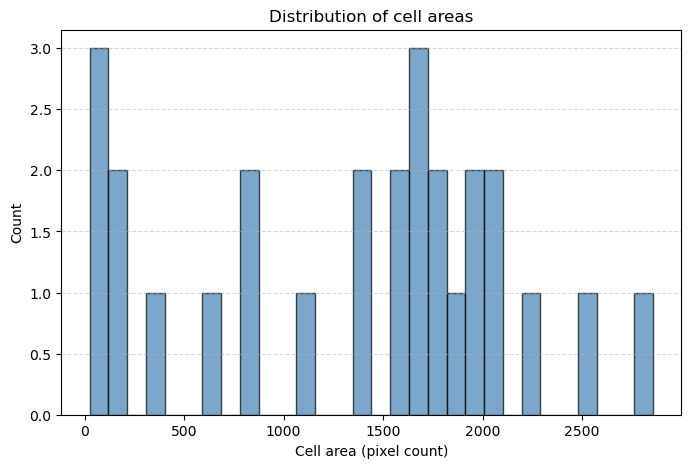

In [16]:
import numpy as np
from skimage.measure import regionprops
import pandas as pd
import matplotlib.pyplot as plt

# --- Extract region properties from instance mask ---
props = regionprops(masks)

cell_ids   = [p.label for p in props]
areas      = [p.area for p in props]     # area in pixels
centroids  = [p.centroid for p in props]

stats = pd.DataFrame({
    "CellID": cell_ids,
    "Area_px": areas,
    "Centroid": centroids
})

# --- Summary statistics ---
n_cells = len(props)
avg_area = np.mean(areas) if areas else 0

print(f"Number of cells: {n_cells}")
print(f"Average cell area (px): {avg_area:.2f}")

# --- Histogram of areas ---
plt.figure(figsize=(8, 5))
plt.hist(areas, bins=30, color="steelblue", edgecolor="black", alpha=0.7)
plt.xlabel("Cell area (pixel count)")
plt.ylabel("Count")
plt.title("Distribution of cell areas")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.show()


### Application to non-cellular images

How well can Cellpose-SAM generalize to non-cellular data?
Like this image here of vegetables?

<img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/vegetables.png?raw=1" alt="cellpose" width="700">



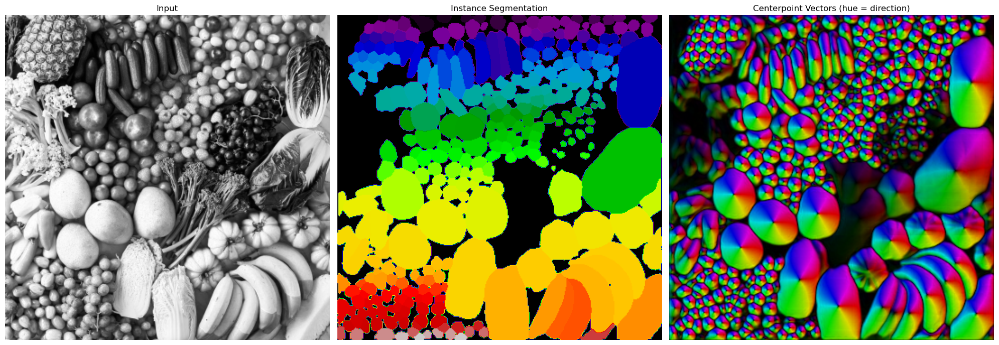

In [32]:
from skimage import io

# --- Path to input image ---
image_path = "images/vegetables_360.png"

# --- Load image and convert to grayscale ---
img = io.imread(image_path)[..., :3]
img = np.max(img, axis=2)

# --- Load pretrained CellPose-SAM model ---
model = models.CellposeModel(gpu=True)

# --- Run forward pass (inference) ---
masks, flows, styles = model.eval(img)

# --- Plot instance segmentation mask ---
plot_cellpose_predictions(img, masks, flows)

And cityscapes?

<img src="https://github.com/Kainmueller-Lab/HIDA_lecture_image_segmentation/blob/main/images/cityscapes_example.png?raw=1" alt="cellpose" width="700">


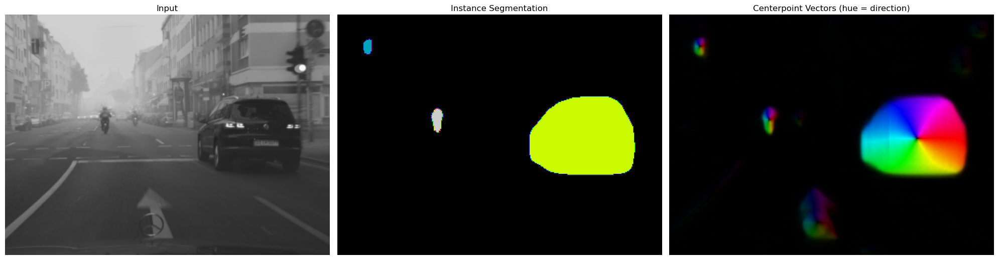

In [39]:
# --- Path to input image ---
image_path = "images/cityscapes_example_360.png"

# --- Load image and convert to grayscale ---
img = io.imread(image_path)[..., :3]
img = np.max(img, axis=2)

# --- Load pretrained CellPose-SAM model ---
model = models.CellposeModel(gpu=True)

# --- Run forward pass (inference) ---
masks, flows, styles = model.eval(img)

# --- Plot instance segmentation mask ---
plot_cellpose_predictions(img, masks, flows)